# Shopper's Recommendation Algorithm :

## Importing Libraries :

In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import missingno as msno
import altair as alt
import plotly.express as px
import plotly.graph_objects as go

In [3]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

In [4]:
from apyori import apriori

## Importing Data :

In [5]:
data = pd.read_excel('Shoppers1.xlsx')

In [6]:
data.head()

,S.no,Email,Billing_Phone,Name,Shipping_city,Category_Grouped,Category,Sub_category,Product_Gender,Segment,...,Coupon_Percentage,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective,Value_CM1,Value_CM2,Special_price,Paid_pr
0,1,abhinav_025@rediffmail.com,9.194245e+11,ABHINAV CHATTER,Jabalpur,Others,SUNGLASSES,SUNGLASSES,UNISEX,SUNGLASSES,...,0.0,1,2294.54,4999,4999.0,4544.38,1722.77,1134.77,4999,4544
1,2,amitgalphade@rediffmail.com,9.193777e+11,AMIT GALPHADE,Ahmedabad,Apparels,Sports Equipment,Sports Apparel,MEN,MENS WEAR,...,NaN,1,2919.33,4999,4999.0,4999.00,1499.87,876.87,4999,4999
2,3,prabhu.nambiappan@gmail.com,9.198401e+11,PRABHU NAMBIAPP,Chennai,Others,Bags,Bags,UNISEX,UNISEX,...,NaN,1,2186.66,4095,4095.0,4095.00,1433.07,955.07,4095,4095
3,4,mallihm2002@yahoo.com,9.197316e+11,MALLIKARJUNA H,Bangalore,Apparels,Sports Equipment,Sports Apparel,MEN,MENS WEAR,...,NaN,1,2919.33,4999,4999.0,4999.00,1499.87,876.87,4999,4999
4,5,anupamupadhyay@yahoo.com,9.197120e+11,ANUPAM UPADHYAY,Gurgaon,NaN,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,...,25.0,1,5167.83,7495,7495.0,5621.25,-198.99,-357.99,7495,5621


In [7]:
data.iloc[0:3, 0:10]

,S.no,Email,Billing_Phone,Name,Shipping_city,Category_Grouped,Category,Sub_category,Product_Gender,Segment
0,1,abhinav_025@rediffmail.com,9.194245e+11,ABHINAV CHATTER,Jabalpur,Others,SUNGLASSES,SUNGLASSES,UNISEX,SUNGLASSES
1,2,amitgalphade@rediffmail.com,9.193777e+11,AMIT GALPHADE,Ahmedabad,Apparels,Sports Equipment,Sports Apparel,MEN,MENS WEAR
2,3,prabhu.nambiappan@gmail.com,9.198401e+11,PRABHU NAMBIAPP,Chennai,Others,Bags,Bags,UNISEX,UNISEX


## Starting with the city having maximum shipments : 

In [8]:
data['Shipping_city'].value_counts()[:].values.sum()

647185

In [9]:
data['Shipping_city'].value_counts().head(24)

New Delhi        58950
Chennai          54471
Bangalore        49516
Mumbai           40322
Hyderabad        36228
Pune             19501
Kolkata          16528
Lucknow          12133
Noida             9571
Ghaziabad         8972
Vishakapatnam     8923
Gurgaon           8829
Ahmedabad         7977
Bhopal            7895
Thane             7845
Coimbatore        7618
Kanpur            6621
Patna             6608
Bhubaneshwar      6463
Indore            6391
Nagpur            6123
Surat             5964
Jaipur            5818
Secunderabad      5215
Name: Shipping_city, dtype: int64

Since Delhi is the city with maximum shipment counts, I preferred to start exploring the data with Delhi.

In [10]:
delhi_data = data.loc[data['Shipping_city'] == 'New Delhi']

In [11]:
delhi_data.head()

,S.no,Email,Billing_Phone,Name,Shipping_city,Category_Grouped,Category,Sub_category,Product_Gender,Segment,...,Coupon_Percentage,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective,Value_CM1,Value_CM2,Special_price,Paid_pr
12,13,parmendra_kumar@yahoo.com,9.199711e+11,parmendra kumar,New Delhi,NaN,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,...,NaN,1,5875.87,7495,5621.0,5621.0,-907.25,-1090.25,5621,5621
13,14,sanjubaba_468@yahoo.co.in,9.198107e+11,SANJAY SAINI,New Delhi,NaN,Men Footwear,MENS FOOTWEAR,MEN,MENS FOOTWEAR,...,NaN,1,3210.33,5795,4636.0,4636.0,887.97,423.97,4636,4636
24,25,niranjan.k.mishra@gmail.com,9.198114e+11,NIRANJAN MISHRA,New Delhi,Shoes,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,...,0.0,1,3211.31,5499,5499.0,4499.0,765.88,349.88,5499,4499
26,27,pcmarwah@yahoo.co.in,9.198115e+11,pc marwah,New Delhi,Shoes,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,...,0.0,1,3211.31,5499,5499.0,4499.0,765.88,349.88,5499,4499
34,35,amitagagarwal@gmail.com,9.193120e+11,AMIT AGRAWAL,New Delhi,Shoes,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,...,NaN,1,3679.56,6200,6200.0,6200.0,1801.35,1231.35,6200,6200


### Missing values in Data :

White spaces in the black bars provide a pictorial representation of missing values in a certain column.

<AxesSubplot:>

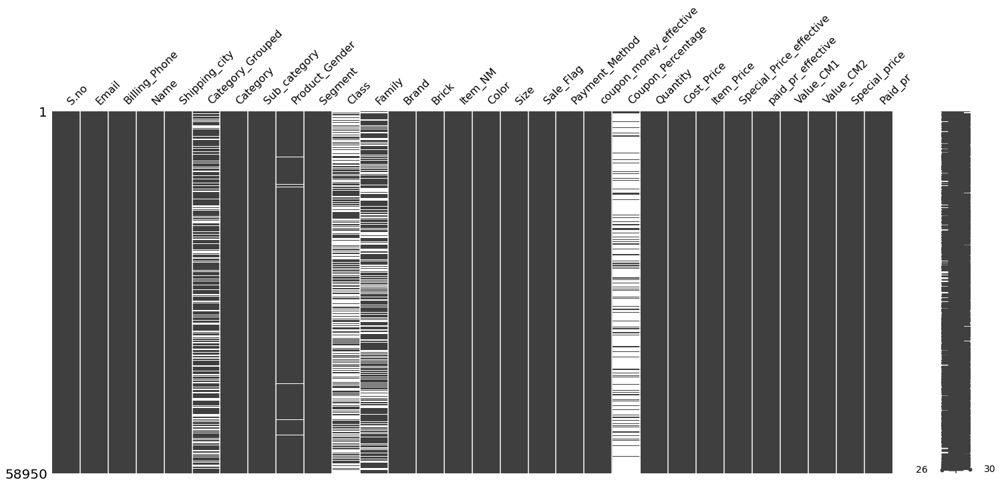

In [12]:
msno.matrix(delhi_data)

### Dropping certain columns to make Dataset more manageable :

Certain columns that have a huge amount of missing values need to be dropped to retain the sanity of the data. Apart from this, the columns which contain values that are repetitions, need to be dropped as well. 

In [13]:
delhi_data1 = delhi_data.drop(['Billing_Phone','Coupon_Percentage','Category_Grouped','Class','Family','Name','Value_CM1','Value_CM2','Special_price','Paid_pr'], axis = 1, inplace = False)

### Rechecking for missing values :

In [14]:
delhi_data1.isna().sum()

S.no                         0
Email                        0
Shipping_city                0
Category                     0
Sub_category                 0
Product_Gender             663
Segment                      0
Brand                        0
Brick                        0
Item_NM                      0
Color                        0
Size                         0
Sale_Flag                    0
Payment_Method               0
coupon_money_effective       0
Quantity                     0
Cost_Price                   0
Item_Price                   0
Special_Price_effective      0
paid_pr_effective            0
dtype: int64

### Imputing missing values :

Since a very small percentage of data is missing from the column "Product_Gender", this can be imputed without affecting the pattern of the Data.

In [15]:
delhi_data1['Product_Gender'].mode()

0    MEN
dtype: object

In [16]:
delhi_data1['Product_Gender'].fillna(value = "MEN", inplace=True )

In [17]:
delhi_data1['Product_Gender'].isna().sum()

0

## Exploratory Data Analysis :

In [18]:
delhi_data1.head(1)

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,Men Footwear,Mens Footwear,MEN,MENS FOOTWEAR,WOODLAND,BOOTS,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0


In [19]:
delhi_data1['Category'].unique()

array(['Men Footwear', 'Furniture', 'SUNGLASSES', 'Women Apparel', 'Bags',
       'Women Footwear', 'Jewellery', 'WATCHES', 'Sports Equipment',
       'Home', 'Men Apparel'], dtype=object)

In [20]:
delhi_data1['Sub_category'].unique()

array(['Mens Footwear', 'MENS FOOTWEAR', 'LIVING', 'SUNGLASS', 'Ethnic',
       'Bags', 'Womens Footwear', 'Jewellery', 'WATCHES',
       'Sports Apparel', 'ETHNIC', 'Home Furnishing', 'SUNGLASSES',
       'BOTTOMS', 'Sports Equipment', 'Mens Bag'], dtype=object)

In [21]:
delhi_data1['Category'] = delhi_data1['Category'].str.lower()
delhi_data1['Sub_category'] = delhi_data1['Sub_category'].str.lower()

In [22]:
delhi_data1['Product_Gender'] = delhi_data1['Product_Gender'].str.lower()
delhi_data1['Segment'] = delhi_data1['Segment'].str.lower()
delhi_data1['Brand'] = delhi_data1['Brand'].str.lower()
delhi_data1['Brick'] = delhi_data1['Brick'].str.lower()

In [23]:
delhi_data1.head()

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
13,14,sanjubaba_468@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,nike,running shoes,Air Max Compete Tr White Running Shoes,WHITE,8,Not on Sale,COD,0.0,1,3210.33,5795,4636.0,4636.0
24,25,niranjan.k.mishra@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,puma,sneakers,Street Tuneo Mid Black Sneakers,BLACK,9,Not on Sale,COD,1000.0,1,3211.31,5499,5499.0,4499.0
26,27,pcmarwah@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,adidas,running shoes,Adizero F50 2 M Black Running Shoes,BLACK,7,On Sale,Prepaid,1000.0,1,3211.31,5499,5499.0,4499.0
34,35,amitagagarwal@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,reebok,running shoes,Reebok Sports Shoes Black,BLACK,10,Not on Sale,COD,0.0,1,3679.56,6200,6200.0,6200.0


In [24]:
px.histogram(delhi_data1, x="Category", color="Product_Gender")

In [25]:
px.histogram(delhi_data1, x="Category", color="Brand")

In [26]:
px.histogram(delhi_data1, x="Category", color="Payment_Method")

In [27]:
px.histogram(delhi_data1, x="Sale_Flag", color="Payment_Method")

In [28]:
px.histogram(delhi_data1, x="Category", color="coupon_money_effective")

In [29]:
delhi_data1.head()

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
13,14,sanjubaba_468@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,nike,running shoes,Air Max Compete Tr White Running Shoes,WHITE,8,Not on Sale,COD,0.0,1,3210.33,5795,4636.0,4636.0
24,25,niranjan.k.mishra@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,puma,sneakers,Street Tuneo Mid Black Sneakers,BLACK,9,Not on Sale,COD,1000.0,1,3211.31,5499,5499.0,4499.0
26,27,pcmarwah@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,adidas,running shoes,Adizero F50 2 M Black Running Shoes,BLACK,7,On Sale,Prepaid,1000.0,1,3211.31,5499,5499.0,4499.0
34,35,amitagagarwal@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,reebok,running shoes,Reebok Sports Shoes Black,BLACK,10,Not on Sale,COD,0.0,1,3679.56,6200,6200.0,6200.0


In [30]:
delhi_data1['Brick'].unique()

array(['boots', 'running shoes', 'sneakers', 'nest of table', 'oval',
       'suit set', 'strolley', 'basketball shoes', 'handbag',
       'dress shoes', 'loafers', 'necklace set', 'analog watch', 'tights',
       'sarees', 'carpets', 'aviator', 'football shoes', 'cricket',
       'casual trousers', 'sunglasses', 'chronograph watches',
       'chronograph', 'hiking accessories', 'dress materials'],
      dtype=object)

In [31]:
boots_customers = delhi_data1.loc[delhi_data1['Brick'] == 'boots']

In [32]:
boots_customers.head()

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
40,41,s_kathuria@rediffmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,3170.11,5095,4585.5,4585.5
631,632,purushottammaurya@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,3170.11,5095,4585.5,4585.5
718,719,malikazharuddin@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,2336.40,4295,4295.0,4295.0
1041,1042,panda.gopal@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,2472.19,4195,4195.0,4195.0


In [33]:
boots_customers['Brand'].unique()

array(['woodland', 'alberto torresi', 'salt n pepper'], dtype=object)

In [34]:
boots_customers['Product_Gender'].unique()

array(['men', 'women'], dtype=object)

In [35]:
boots_customers_men = boots_customers.loc[(boots_customers['Product_Gender'] == 'men') & (boots_customers['Brand'] == 'woodland')]

In [36]:
boots_customers_men.head()

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
1041,1042,panda.gopal@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,2472.19,4195,4195.0,4195.0
1992,1993,chandersatsangi@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,3094.53,5299,5299.0,5299.0
2139,2140,kcsteels@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
2157,2158,ravin_nair01@yahoo.co.in,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0


In [37]:
lst_boots_men = boots_customers_men['Email'].tolist()

In [38]:
lst_boots_men

['parmendra_kumar@yahoo.com',
 'panda.gopal@gmail.com',
 'chandersatsangi@yahoo.co.in',
 'kcsteels@yahoo.co.in',
 'ravin_nair01@yahoo.co.in',
 'mishra_bhuwan@rediffmail.com',
 'prasad.avishek@gmail.com',
 'ak_purswani@yahoo.com',
 'adam27roswell@gmail.com',
 'onlysomanath@gmail.com',
 'anamikaguglani@gmail.com',
 'ANU_SS.A1974@YAHOO.COM',
 'gyanesh.sachan@gmail.com',
 'neelamsh77@rediffmail.com',
 'p_vashisth@hotmail.com',
 'abhijatya_raj@yahoo.com',
 'amit_yadav77@rediffmail.com',
 'rajesh.raushan9840@gmail.com',
 'kanika.bioinformatics@gmail.com',
 'randhir_nalanda18@yahoo.co.in',
 'narenwakode@gmail.com',
 'prayanksharma@gmail.com',
 'rakeshkmr007@gmail.com',
 'mohammad84@rediffmail.com',
 'anirbanb72@yahoo.com',
 'dineshbalodi@yahoo.com',
 'sanjaykumarsinghca@gmail.com',
 'samir_in21@yahoo.com',
 'bhaskaradr@yahoo.com',
 'ges_sareen@yahoo.com',
 'gaurmanoj78@rediffmail.com',
 'rakesh215@gmail.com',
 'raj.mech50@gmail.com',
 'shawsantosh2000@yahoo.com',
 'manishderma@gmail.com',
 'p

## Output of all the Mail Ids to a notepad text file :

In [39]:
with open("file1.txt", "w") as output:
    output.write(str(lst_boots_men))

## Conclusions :

The implications and the possible combinations of such an Analysis in the age of Cross Selling and Up Selling is very wide. After identifying the users who have ordered  **Men's Boots** from the Brand **Woodland** the UI designer or the Marketing Team can pitch related products like **Jeans** or **Outdoor Sports Gear** for Cross Selling or similar or better quality shoes from other brands or from the same brand for Up Selling.

Such Analysis is possible for almost every category of products and the COmbinations of factors are probably endless.












## Predicting Human Behaviour :

This is my brief attempt in analysing human behaviour using unsupervised learning algorithm :

In [40]:
boots_customers.head()

,S.no,Email,Shipping_city,Category,Sub_category,Product_Gender,Segment,Brand,Brick,Item_NM,Color,Size,Sale_Flag,Payment_Method,coupon_money_effective,Quantity,Cost_Price,Item_Price,Special_Price_effective,paid_pr_effective
12,13,parmendra_kumar@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,5875.87,7495,5621.0,5621.0
40,41,s_kathuria@rediffmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,3170.11,5095,4585.5,4585.5
631,632,purushottammaurya@yahoo.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,3170.11,5095,4585.5,4585.5
718,719,malikazharuddin@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,alberto torresi,boots,Black Boots,BLACK,8,Not on Sale,COD,0.0,1,2336.40,4295,4295.0,4295.0
1041,1042,panda.gopal@gmail.com,New Delhi,men footwear,mens footwear,men,mens footwear,woodland,boots,Tan Boots,TAN,8,Not on Sale,COD,0.0,1,2472.19,4195,4195.0,4195.0


In [41]:
boots_customer_refined = boots_customers.drop(['S.no', 'Email', 'Shipping_city', 'Category', 'Sub_category', 'Product_Gender', 'Segment', 'Brick', 'Brand', 'Item_NM', 'Color', 'Size', 'Sale_Flag', 'Payment_Method', 'Special_Price_effective'], axis = 1) 

In [42]:
boots_customer_refined.head()

,coupon_money_effective,Quantity,Cost_Price,Item_Price,paid_pr_effective
12,0.0,1,5875.87,7495,5621.0
40,0.0,1,3170.11,5095,4585.5
631,0.0,1,3170.11,5095,4585.5
718,0.0,1,2336.40,4295,4295.0
1041,0.0,1,2472.19,4195,4195.0


In [45]:
boots_customer_refined.reset_index(inplace = True, drop = True)

In [46]:
boots_customer_refined.head(2)

,coupon_money_effective,Quantity,Cost_Price,Item_Price,paid_pr_effective
0,0.0,1,5875.87,7495,5621.0
1,0.0,1,3170.11,5095,4585.5


In [47]:
px.histogram(boots_customer_refined, x="Item_Price", color="paid_pr_effective")

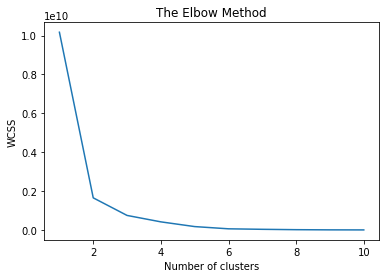

In [48]:
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(boots_customer_refined)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

There is a sharp decrease in the drop of the Elbow curve when we are at 3 clusters. So let us go forward with 3 clusters in the Algorithm.

In [49]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer

#### Standardization :

In [51]:
sc = StandardScaler()
df1 = sc.fit_transform(boots_customer_refined)

In [52]:
df1 = pd.DataFrame(df1, columns = boots_customer_refined.columns)

In [53]:
df1.head(1)

,coupon_money_effective,Quantity,Cost_Price,Item_Price,paid_pr_effective
0,0.0,0.0,1.574894,1.425378,1.166695


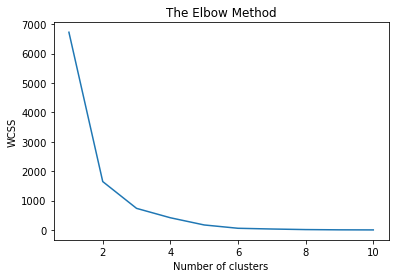

In [54]:
wcss2=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(df1)
    wcss2.append(kmeans.inertia_)
plt.plot(range(1,11),wcss2)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

#### Normalization :

In [55]:
nm =  Normalizer()
df2 = nm.fit_transform(boots_customer_refined)

In [56]:
df2 = pd.DataFrame(df2, columns = boots_customer_refined.columns)

In [57]:
df2.head()

,coupon_money_effective,Quantity,Cost_Price,Item_Price,paid_pr_effective
0,0.0,0.000090,0.531331,0.677742,0.508284
1,0.0,0.000132,0.419761,0.674640,0.607176
2,0.0,0.000132,0.419761,0.674640,0.607176
3,0.0,0.000154,0.359010,0.659967,0.659967
4,0.0,0.000156,0.384650,0.652704,0.652704


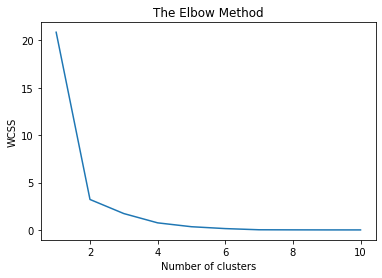

In [58]:
wcss3=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(df2)
    wcss3.append(kmeans.inertia_)
plt.plot(range(1,11),wcss3)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [59]:
algorithm = (KMeans(n_clusters = 3 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(df2)
labels3 = algorithm.labels_
centroids3 = algorithm.cluster_centers_

In [60]:
import plotly as py
py.offline.init_notebook_mode(connected = True)

In [61]:
df1['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df2['Cost_Price'],
    y= df2['Item_Price'],
    z= df2['paid_pr_effective'],
    mode='markers',
     marker=dict(
        color = df1['label3'], 
        size= 10,
        line=dict(
            color= df1['label3'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Cost_Price'),
            yaxis = dict(title  = 'Item_Price'),
            zaxis = dict(title  = 'paid_pr_effective')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [62]:
df1['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df2['Cost_Price'],
    y= df2['coupon_money_effective'],
    z= df2['paid_pr_effective'],
    mode='markers',
     marker=dict(
        color = df1['label3'], 
        size= 10,
        line=dict(
            color= df1['label3'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Cost_Price'),
            yaxis = dict(title  = 'Coupon_money_effective'),
            zaxis = dict(title  = 'Paid_pr_effective')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

### Conclusions :

My Idea behind performing such a clustering is that people tend to buy more of those items which are on sale, or which have an inflated mark-up price and then shown to be discounted. The results would be best interpreted by a Business Analyst.
